In [4]:
import os
data_folder = os.path.join("data","archive","ADEChallengeData2016")
images_num = len(os.listdir(os.path.join(data_folder, "images", "training")))
print(f"Number of images in the dataset: {images_num}")
image_train_folder = os.path.join(data_folder, "images", "training")
annotation_train_folder = os.path.join(data_folder, "annotations", "training")
from torch.utils.data import Dataset
from PIL import Image
class ADE20KDataset(Dataset):
    def __init__(self, image_folder, annotation_folder, transform=None):
        self.image_folder = image_folder
        self.annotation_folder = annotation_folder
        self.transform = transform
        self.image_filenames = sorted(os.listdir(image_folder))
    def __len__(self):
        return len(self.image_filenames)
    def __getitem__(self, idx):
        image_filename = self.image_filenames[idx]
        annotation_filename = image_filename.replace(".jpg", ".png")
        image_path = os.path.join(self.image_folder, image_filename)
        annotation_path = os.path.join(self.annotation_folder, annotation_filename)
        image = Image.open(image_path).convert("RGB")
        annotation = Image.open(annotation_path)
        if self.transform:
            image = self.transform(image)
            annotation = self.transform(annotation)
        return {"image": image, "annotation": annotation}
dataset = ADE20KDataset(image_train_folder, annotation_train_folder) # train dataset

index = 10
image = dataset[index]['image'] # image
dataset[index]["annotation"] # mask with classes ids


print(type(image)) # PIL image
print(image.size) # different for all photos, nie wiem do jakiej wielkości chcemy resizować

Number of images in the dataset: 20210
<class 'PIL.Image.Image'>
(356, 247)


info on objects and their classes in objectinfo.txt file
- klasa 0 to jest tło / inne (gdzieś to widziałem że pisali ale teraz nie mogę znaleźć)

### reklamy:
~~board, plank  -> **ID **~~

bulletin board, notice board (308)-> **ID 145**

signboard, sign (6108) -> **ID 44**

jednak żadne z powyższych nie jest reklamą i reklama jest jako tło uznawana więc usuwania reklam nie zrobimy na tym datasecie, ale ciągle mam y 150 klas

### ludzie

- person, individual, someone, somebody, mortal, soul-> **ID 13**

In [5]:
target_mask = 13 # person is 13
import numpy as np
# all images with target_mask
images_with_target_mask = []
for i in range(len(dataset)):
    if i % 1000 == 0:
        print(i)
    annotation = np.array(dataset[i]["annotation"])
    if target_mask in annotation:
        #print("succes")
        images_with_target_mask.append(i)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000


5069


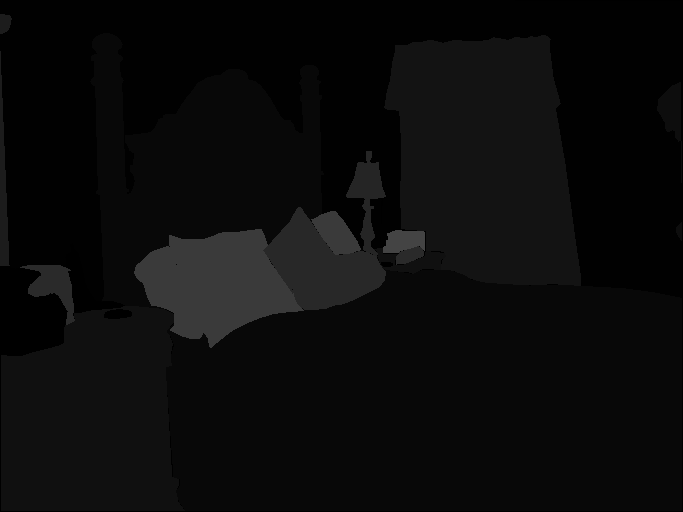

In [6]:
print(len(images_with_target_mask))
dataset[images_with_target_mask[4]]["annotation"]

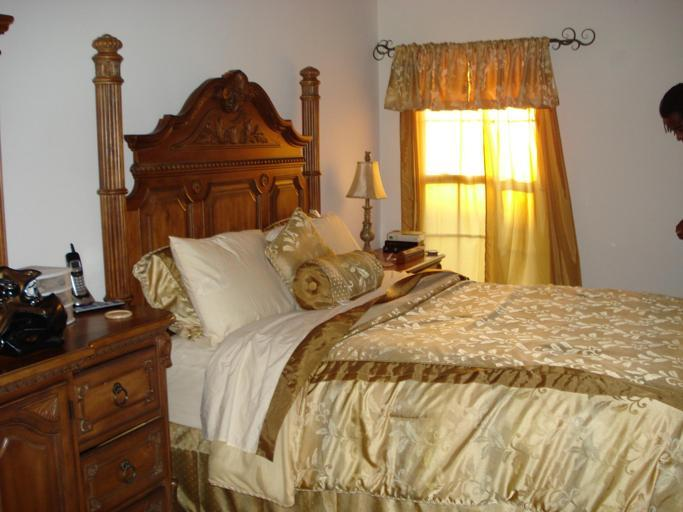

In [7]:
dataset[images_with_target_mask[4]]["image"]

In [8]:
# annot = dataset[index]["annotation"]
# annot_np = np.array(annot)
# print(annot_np[0])

In [9]:
import matplotlib.pyplot as plt
def draw_np_array(array):
    import matplotlib.pyplot as plt
    plt.imshow(array)
    plt.axis('off')
    plt.show()

In [10]:
'''pokazuje wszystkie maski obecne na obrazku'''
# for i in range(150):
#     mask =  np.array(dataset[images_with_target_mask[4]]["annotation"]) != i
#     if np.sum(mask) > 0:
#         print(f"Mask for class {i} found with {np.sum(mask)} pixels.")
#         draw_np_array(mask)

'pokazuje wszystkie maski obecne na obrazku'

In [11]:
import cv2
def enlarge_mask(mask: np.ndarray, pixels: int = 5) -> np.ndarray:
    """
    Enlarge positive areas (True or 1) in a binary mask.
    
    Args:
        mask: 2D boolean or 0/1 numpy array
        pixels: number of pixels to grow/dilate

    Returns:
        np.ndarray of same shape, dtype=bool
    """
    # ensure binary uint8
    mask_uint8 = mask.astype(np.uint8)  # 0 or 1
    mask_uint8 *= 255  # 0 or 255
    
    # create kernel for dilation
    kernel = np.ones((2*pixels+1, 2*pixels+1), np.uint8)
    
    # dilate
    dilated = cv2.dilate(mask_uint8, kernel, iterations=1)
    
    # convert back to boolean
    return dilated.astype(bool)

In [12]:
image_number = 8

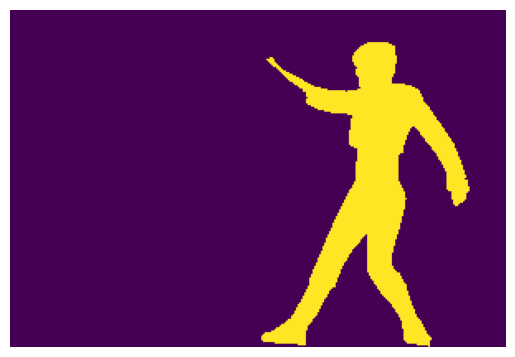

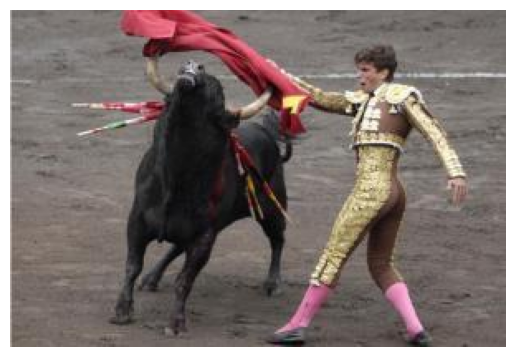

In [13]:
mask = np.array(dataset[images_with_target_mask[image_number]]["annotation"]) == target_mask
image = np.array(dataset[images_with_target_mask[image_number]]["image"]) 
draw_np_array(mask) 
draw_np_array(image)

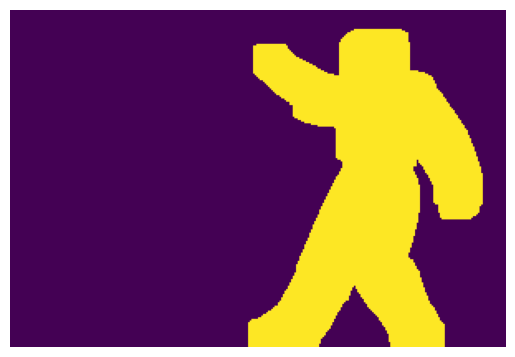

In [14]:
dilated_mask = enlarge_mask(mask, 8)
draw_np_array(dilated_mask)

# inpainting

In [15]:
from PIL import Image
# from simple_lama_inpainting import SimpleLama


In [16]:
# from simple_lama_inpainting import SimpleLama
# import inspect

# print(inspect.getfile(SimpleLama))


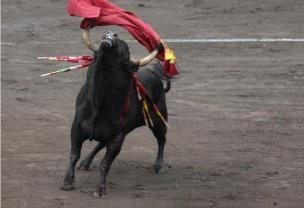

In [17]:


# initialize model
# simple_lama = SimpleLama()

from lama.simple_lama import SimpleLama

simple_lama = SimpleLama(model_path="models/big-lama.pt")


# NOTE: LaMa expects a binary mask: 255 where you want to inpaint

mask_image = Image.fromarray((dilated_mask.astype(np.uint8) * 255)).convert("L")

# run inpainting
result = simple_lama(image, mask_image)

# show or save
#result.save("inpainted_lama.png")
result


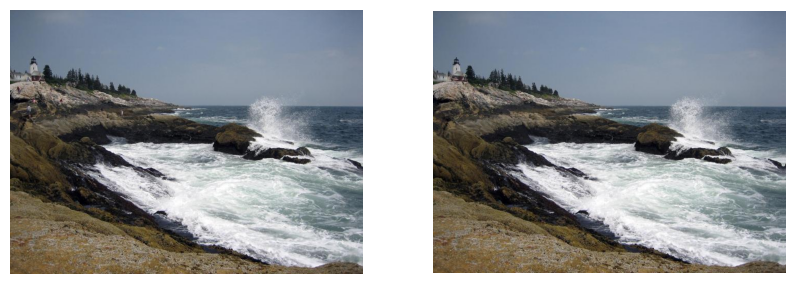

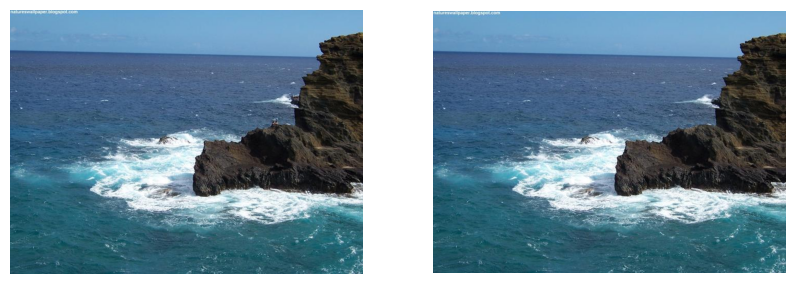

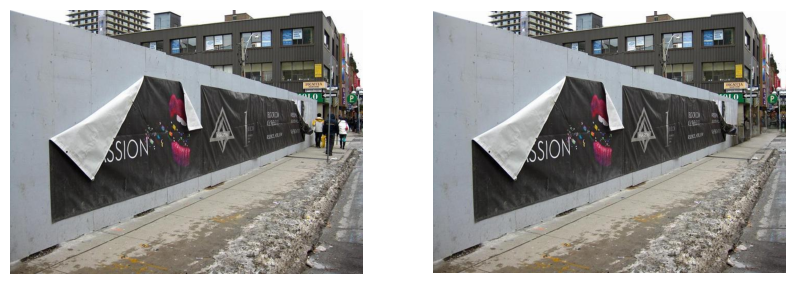

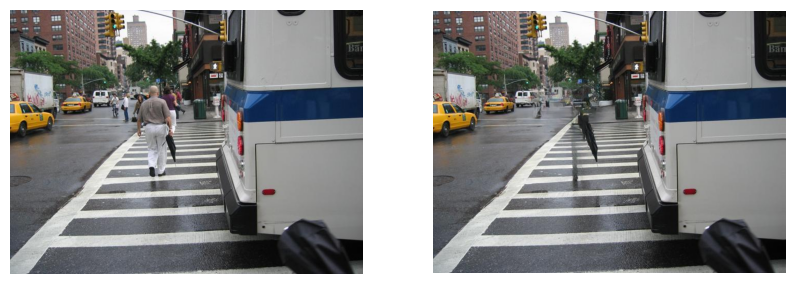

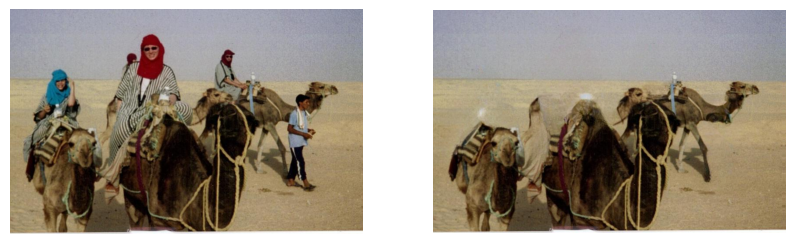

...

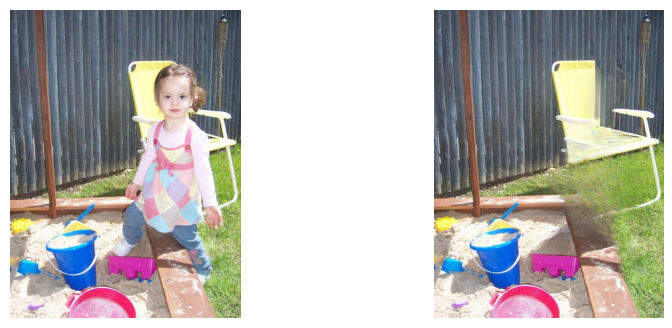

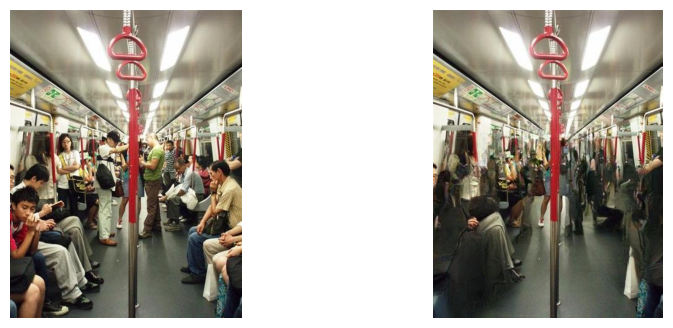

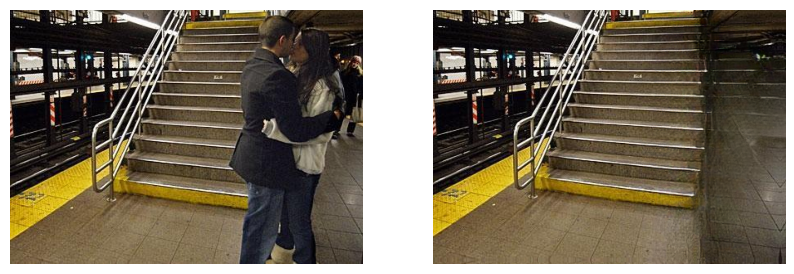

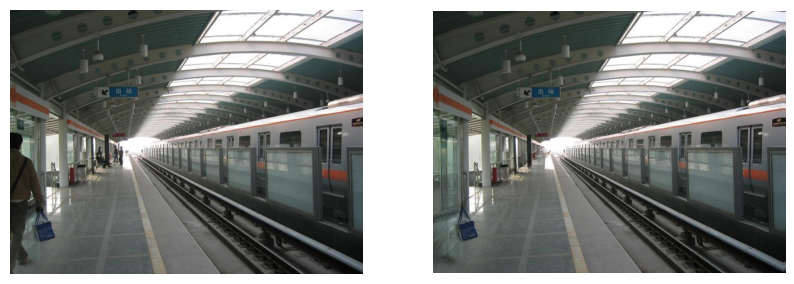

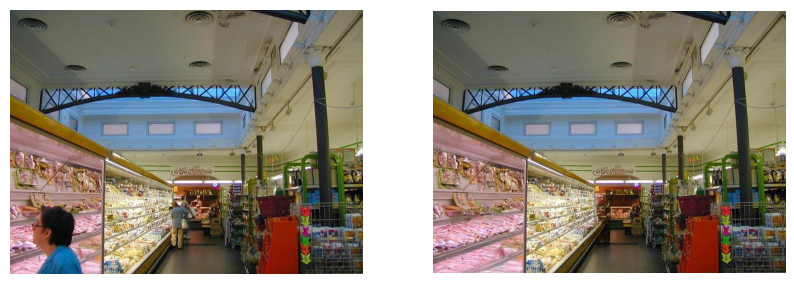

In [18]:
for i in range(10, 30):
    mask = np.array(dataset[images_with_target_mask[i]]["annotation"]) == target_mask
    image = np.array(dataset[images_with_target_mask[i]]["image"]) 
    dilated_mask = enlarge_mask(mask, 8)

    mask_image = Image.fromarray((dilated_mask.astype(np.uint8) * 255)).convert("L")

    # run inpainting
    result = simple_lama(image, mask_image)

    # show or save
    result.save("inpainted_lama.png")
    result

    # create plot where on left is original image with mask and on right is inpainted image
    #
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))  # 1 row, 2 columns
    axes[0].axis('off')
    axes[1].axis('off')

    axes[0].imshow(image)
    axes[1].imshow(result)
    plt.show()


# ready segmentation model

## model 1 info
microsoft/beit-base-finetuned-ade-640-640 
- https://huggingface.co/microsoft/beit-large-finetuned-ade-640-640
- trained on 640 x 640 images, outputs mask of size 16 times smaller than original
- nawet sobie radzi, base model; duży mi crashował kompa; 
- problem jest taki że model nie przewiduje klasy 0 (tło) więc jest troch ograniczony (chociaż chat twierdzi że przewiduje ale ja jakoś tego nie widzę)
- to generuje kolejną rzecz na którą trzeba uważać - w modelu normalne klasy zaczynają się od 0, a w datasecie od 1 więc np w target_mask klasa 13 = człowiek a w modelu klasa 12 = człowiek

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def draw_np_mask(mask, ax=None):
    """
    mask: np.ndarray of shape (H, W) with integer labels
    Draws mask with visually highly distinguishable colors per label.
    Class 0 will also have a unique color.
    """
    if mask.ndim != 2:
        raise ValueError("mask must be 2D (H, W)")

    num_labels = int(mask.max()) + 1  # include class 0

    # Generate HSV colors
    hsv_colors = np.zeros((num_labels, 3))
    hsv_colors[:, 0] = np.linspace(0, 1, num_labels, endpoint=False)  # hue
    hsv_colors[:, 1] = 0.7 + 0.2 * (np.arange(num_labels) % 2)        # alternate saturation slightly
    hsv_colors[:, 2] = 0.7 + 0.2 * ((np.arange(num_labels) // 2) % 2) # alternate brightness

    rgb_colors = mcolors.hsv_to_rgb(hsv_colors)

    # Map mask to RGB
    color_mask = rgb_colors[mask]

    if ax is None:
        plt.figure(figsize=(8, 8))
        plt.imshow(color_mask)
        plt.axis("off")
        plt.show()
    else:
        ax.imshow(color_mask)
        ax.axis("off")


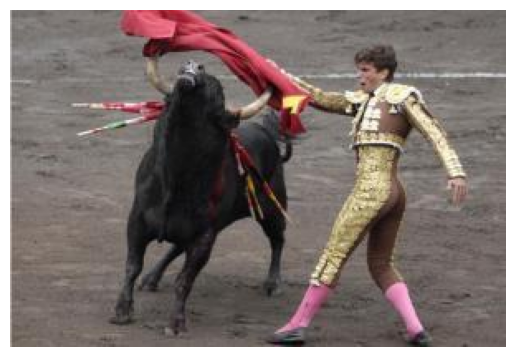

In [78]:
image = dataset[images_with_target_mask[image_number]]["image"]
image_np = np.array(image)

draw_np_array(image_np)

In [79]:
#https://huggingface.co/microsoft/beit-large-finetuned-ade-640-640
from transformers import BeitFeatureExtractor, BeitForSemanticSegmentation
# from datasets import load_dataset
from PIL import Image

# load ADE20k image
# ds = load_dataset("hf-internal-testing/fixtures_ade20k", split="test")

print(type(image))
feature_extractor = BeitFeatureExtractor.from_pretrained('microsoft/beit-base-finetuned-ade-640-640')
model = BeitForSemanticSegmentation.from_pretrained('microsoft/beit-base-finetuned-ade-640-640') #2.5GB ma large model i mi kompa crashował więc base dałem; base ma 900MB

inputs = feature_extractor(images=image_np, return_tensors="pt")
outputs = model(**inputs)
# logits are of shape (batch_size, num_labels, height/4, width/4)
logits = outputs.logits


<class 'PIL.Image.Image'>


torch.Size([1, 150, 160, 160])


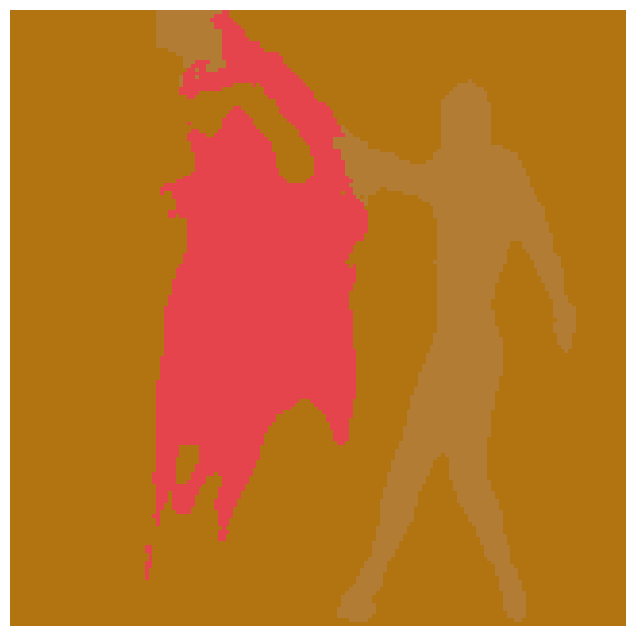

In [80]:
# change logits to output mask (manual bad way)
print(logits.shape)
logits_np = logits.detach().numpy()
result_mask = np.argmax(logits_np, axis=1)[0]

draw_np_mask(result_mask)

In [81]:
# mask_new = np.zeros_like(mask_np.copy())
# mask_new[mask == 12] = 1

# draw_np_mask(mask_new)

300


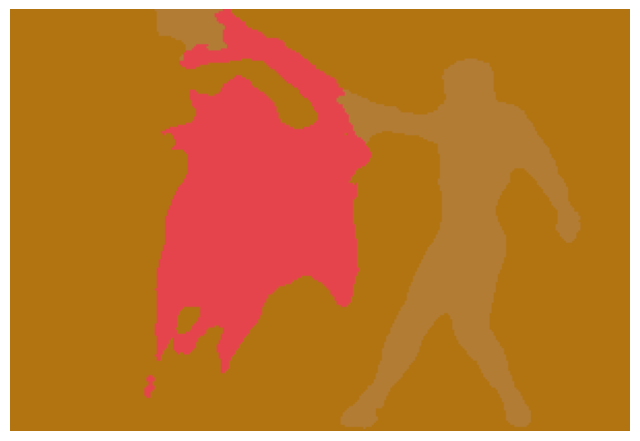

In [82]:
# better way to get segmentation mask
segmentation = feature_extractor.post_process_semantic_segmentation(
    outputs,
    target_sizes=[image.size[::-1]]  # (height, width)
)
mask = segmentation[0]
mask_np = mask.detach().numpy()

print(len(segmentation[0][0]))
draw_np_mask(mask_np)

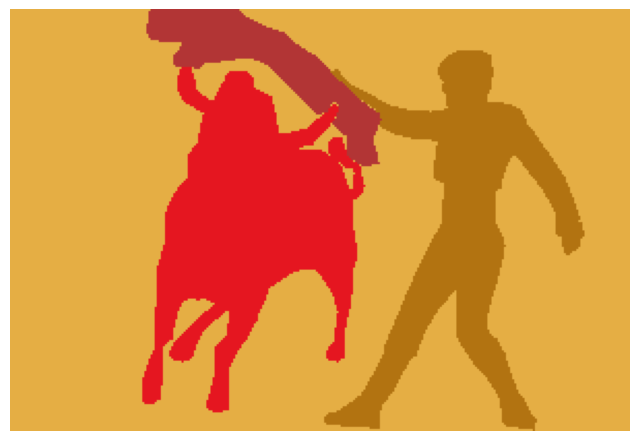

In [83]:
#target amsk
target_mask = dataset[images_with_target_mask[image_number]]["annotation"]
target_mask_np = np.array(target_mask)
draw_np_mask(target_mask_np)

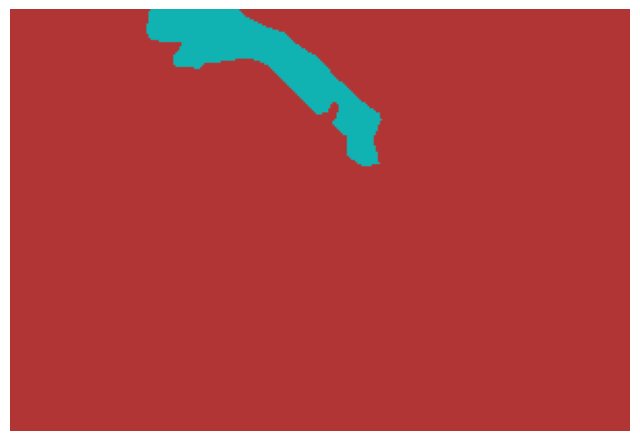

In [84]:
# przkład jak sprawdzić askę z konkretną wartością
mask_new = np.zeros_like(target_mask_np.copy())
mask_new[target_mask_np == 0] = 1

draw_np_mask(mask_new)

In [85]:
#all predicted classes(widać to przesunięcie + brak przewidywania klasy 0 przez model)
np.unique(mask)

array([ 12,  13, 126])

In [86]:
#all trget classes 
target_mask = dataset[images_with_target_mask[image_number]]["annotation"]
np.unique(target_mask)


array([  0,  13,  14, 127], dtype=uint8)

In [87]:
# logits_np[0, 0]

## model 2
- https://huggingface.co/facebook/mask2former-swin-large-ade-semantic
- też nie ma klasy 0 i jest przesunięcie o 1 jak w poprzednim (i też chat twierdzi że przewiduje klasę 0)
- radzi sobei duzo lepiej i jest szybszy 33% jakoś

In [88]:
image = dataset[images_with_target_mask[image_number]]["image"]
image_np = np.array(image)

In [89]:
import requests
import torch
from PIL import Image
from transformers import AutoImageProcessor, Mask2FormerForUniversalSegmentation


# load Mask2Former fine-tuned on ADE20k semantic segmentation
processor = AutoImageProcessor.from_pretrained("facebook/mask2former-swin-large-ade-semantic")
model = Mask2FormerForUniversalSegmentation.from_pretrained("facebook/mask2former-swin-large-ade-semantic")

# url = "http://images.cocodataset.org/val2017/000000039769.jpg"
# image = Image.open(requests.get(url, stream=True).raw)
inputs = processor(images=image_np, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)

# model predicts class_queries_logits of shape `(batch_size, num_queries)`
# and masks_queries_logits of shape `(batch_size, num_queries, height, width)`
class_queries_logits = outputs.class_queries_logits
masks_queries_logits = outputs.masks_queries_logits

# you can pass them to processor for postprocessing
predicted_semantic_map = processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
# we refer to the demo notebooks for visualization (see "Resources" section in the Mask2Former docs)


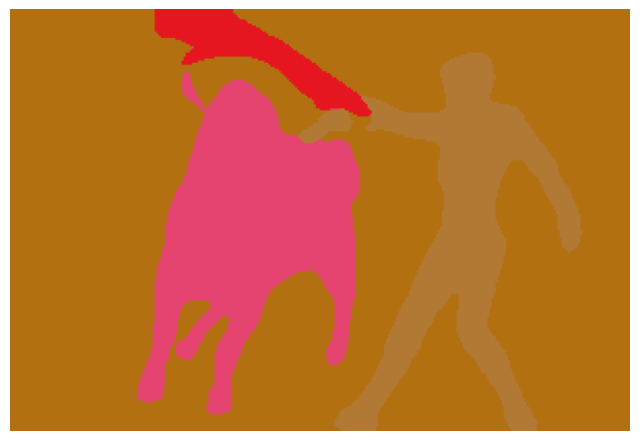

In [90]:
# predicted mask
mask_np = predicted_semantic_map.detach().numpy()
draw_np_mask(mask_np)

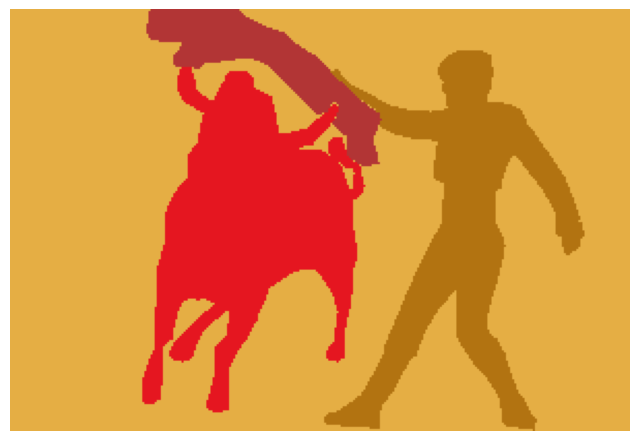

In [91]:
#target amsk
target_mask = dataset[images_with_target_mask[image_number]]["annotation"]
target_mask_np = np.array(target_mask)
draw_np_mask(target_mask_np)

In [92]:
#all predicted classes(widać to przesunięcie + brak przewidywania klasy 0 przez model)
# 131 to jest blanket, cover- więc powiediałbym że lepiej przewiduje niż maska jest dana (przy ocenianiu bym nie brał pod uwagę miejsc gdze w targecie jest klasa 0)
np.unique(mask_np)

array([ 12,  13, 126, 131])

In [93]:
#all target classes
# 131 - 
np.unique(target_mask_np)

array([  0,  13,  14, 127], dtype=uint8)

poniżej jakieś jeszcze testy robiłęm

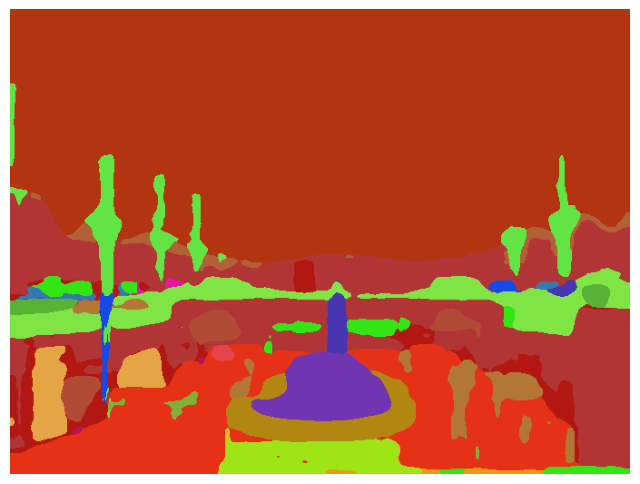

[  0   1   3   4   5   8  12  14  15  17  19  31  32  38  40  42  43  80
  87  88  96 104 123 125 138]


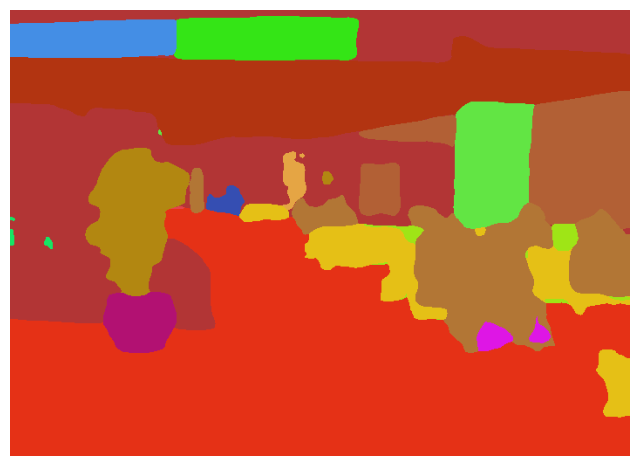

[  0   3   5   8  12  14  17  19  31  42  43  55  82  88 115 125 138]


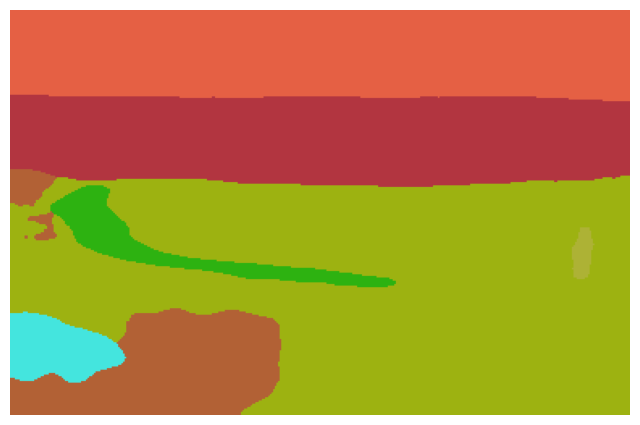

[ 2  4 12 13 21 34 68]


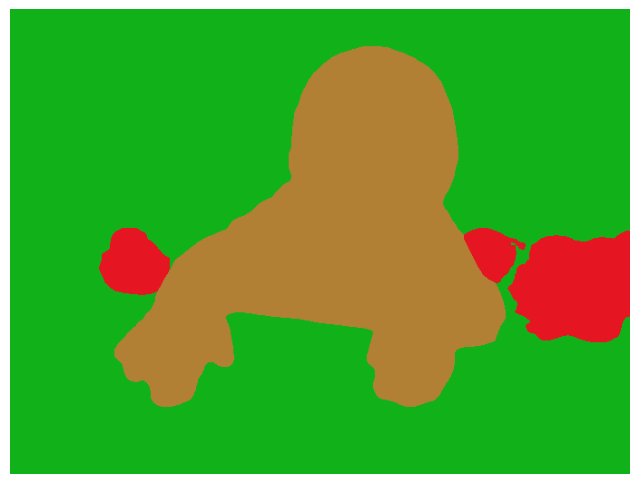

[ 12  41 119]


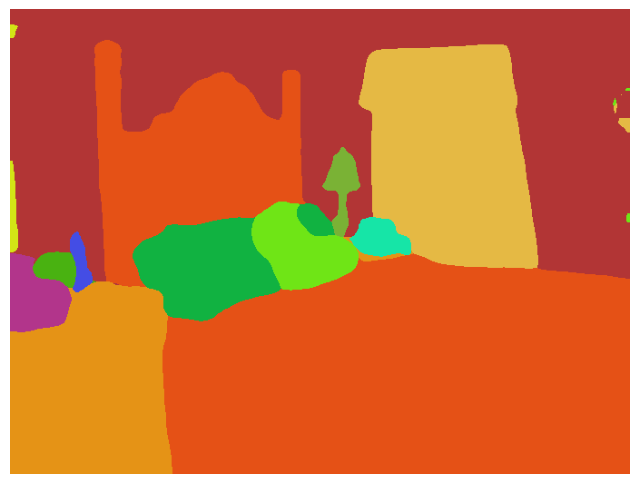

[  0   7  15  18  27  36  39  41  57  67  98 132 148]


In [94]:
num = 0
for i in images_with_target_mask:
    num +=1
    if num > 5:
        break
    image = dataset[i]["image"]
    image_np = np.array(image)
    inputs = processor(images=image_np, return_tensors="pt")

    with torch.no_grad():
        outputs = model(**inputs)

    # model predicts class_queries_logits of shape `(batch_size, num_queries)`
    # and masks_queries_logits of shape `(batch_size, num_queries, height, width)`
    class_queries_logits = outputs.class_queries_logits
    masks_queries_logits = outputs.masks_queries_logits

    # you can pass them to processor for postprocessing
    predicted_semantic_map = processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
    mask_np = predicted_semantic_map.detach().numpy()

    draw_np_mask(mask_np)
    print(np.unique(mask_np))


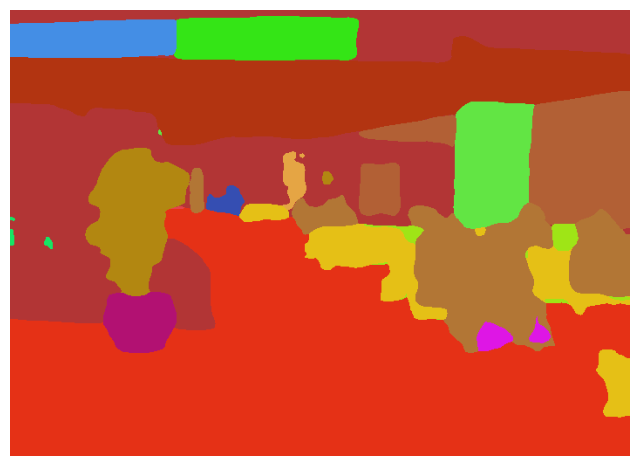

[  0   3   5   8  12  14  17  19  31  42  43  55  82  88 115 125 138]


In [95]:
i =1
image = dataset[i]["image"]
image_np = np.array(image)
inputs = processor(images=image_np, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)

# model predicts class_queries_logits of shape `(batch_size, num_queries)`
# and masks_queries_logits of shape `(batch_size, num_queries, height, width)`
class_queries_logits = outputs.class_queries_logits
masks_queries_logits = outputs.masks_queries_logits

# you can pass them to processor for postprocessing
predicted_semantic_map = processor.post_process_semantic_segmentation(outputs, target_sizes=[image.size[::-1]])[0]
mask_np = predicted_semantic_map.detach().numpy()

draw_np_mask(mask_np)
print(np.unique(mask_np))

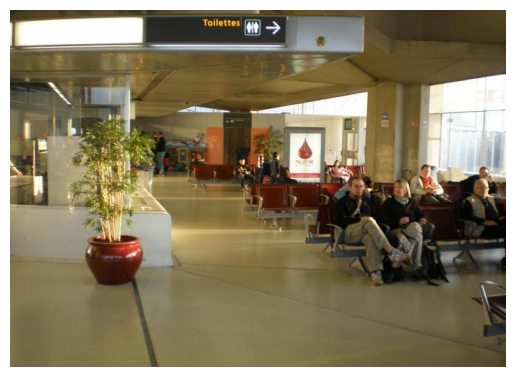

In [96]:
draw_np_array(image_np)

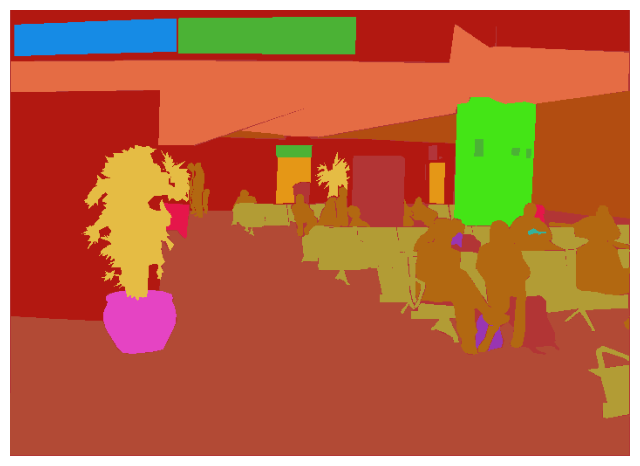

In [ ]:
target = dataset[i]["annotation"]
target_np = np.array(target)
draw_np_mask(target_np)

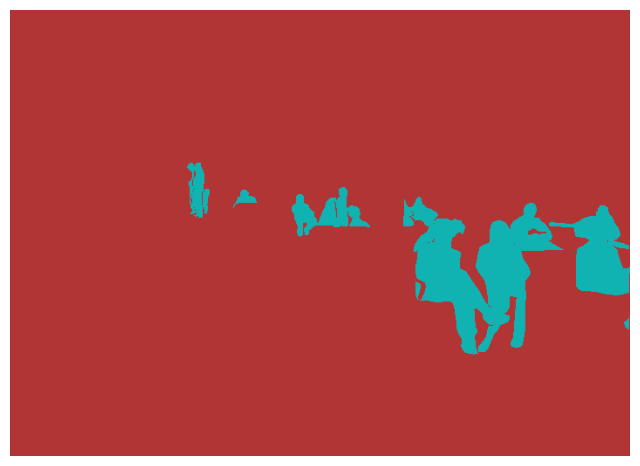

In [ ]:
mask_new = np.zeros_like(target_np.copy())
mask_new[target_np == 13] = 1
draw_np_mask(mask_new)

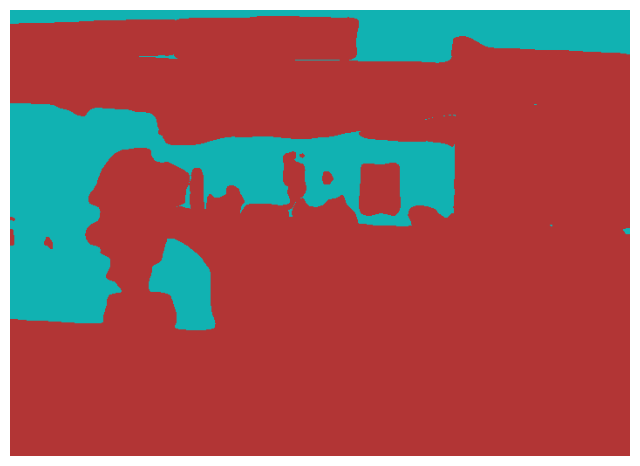

In [ ]:
# przkład jak sprawdzić askę z konkretną wartością
mask_new = np.zeros_like(mask_np.copy())
mask_new[mask_np == 0] = 1

draw_np_mask(mask_new)